<a href="https://colab.research.google.com/github/ashleydelarm/Capstone/blob/main/Capstone2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [31]:
from google.colab import drive
import pandas
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [52]:
import sys
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.utils import to_categorical
import keras
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.layers import Dense
from keras.layers import Flatten
from tensorflow.keras.optimizers import SGD
from keras.layers import BatchNormalization
from keras.preprocessing.image import ImageDataGenerator
import sys
import os
import numpy as np
import random
import torch
import time
import tensorflow_hub as hub

In [33]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [34]:
import os
for dirname, _, filenames in os.walk('/content/drive/MyDrive/ColabNotebooks/asl/'):
    for filename in filenames:
      os.path.join(dirname, filename)

In [35]:
import warnings
warnings.filterwarnings('ignore')

import os, numpy as np, pandas as pd, matplotlib.pyplot as plt

from PIL import Image

from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model


In [36]:
os.chdir('/content/drive/MyDrive/ColabNotebooks/asl/')
os.listdir()

['asl_alphabet_train', 'asl_alphabet_test']

In [37]:
# Training and test paths
train_path = '/content/drive/MyDrive/ColabNotebooks/asl/asl_alphabet_train/asl_alphabet_train/'
test_path = '/content/drive/MyDrive/ColabNotebooks/asl/asl_alphabet_test/asl_alphabet_test/'

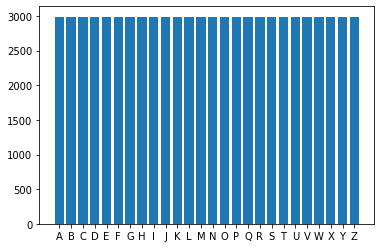

In [38]:

# Class imbalance identification
classes = os.listdir(train_path)
nos = []
for i in classes:
    nos.append(len(os.listdir(train_path+i)))
    
plt.bar(classes, nos)
plt.show()

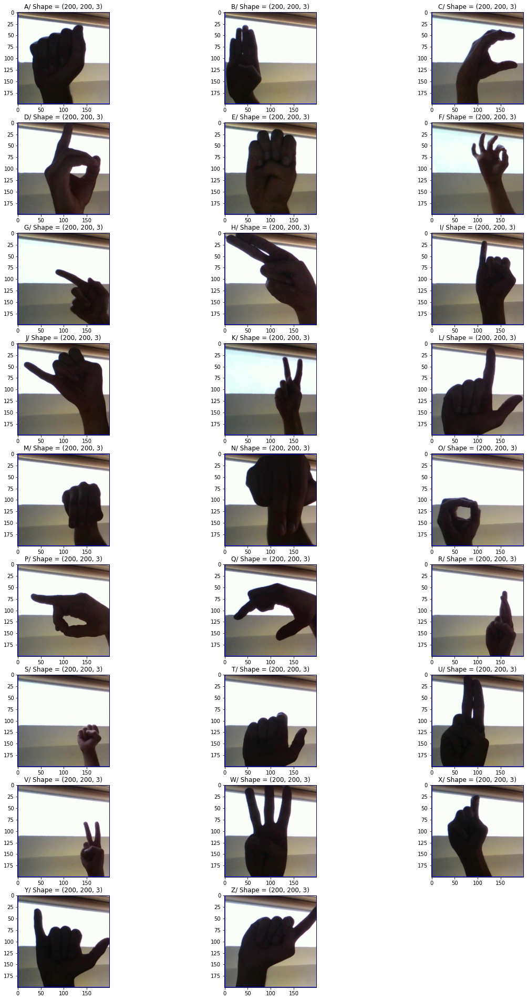

In [39]:
plt.figure(figsize=(20,38))
for i in enumerate(classes):
    image = os.listdir(train_path+i[1])[0]
    image = Image.open(train_path+i[1]+'/'+image)
    image = np.asarray(image)
    plt.subplot(10,3,i[0]+1)
    plt.imshow(image)
    plt.title('{0}/ Shape = {1}'.format(i[1], image.shape))
plt.show()

In [40]:
# dimensions of our images.
img_width = 200
img_height = 200

#we will feed the training images to the neural network
#in batches of 32 images at a time so we don't have 
#to load the entire data set into memory
batch_size = 26

In [41]:
# Creating train and validation sets

datagen = ImageDataGenerator(validation_split=0.2)
datagen2 = ImageDataGenerator(rescale=1.0/255.0)

train_data = datagen.flow_from_directory(train_path, subset='training')
val_data = datagen.flow_from_directory(train_path, subset='validation')
#test_data = datagenTest.flow_from_directory(test_path)

Found 62192 images belonging to 26 classes.
Found 15548 images belonging to 26 classes.


In [42]:
# dimensions of our images.
img_width = 200
img_height = 200

#the directories where our train and test data is
test_data_dir = '/content/drive/MyDrive/ColabNotebooks/asl/asl_alphabet_test/asl_alphabet_test'   #286 images
train_data_dir = '/content/drive/MyDrive/ColabNotebooks/asl/asl_alphabet_train/asl_alphabet_train'  #77,740 images
train_data_sml = '/content/drive/MyDrive/ColabNotebooks/asl_small/asl_small_train/asl_small_train' #1300 images (small version)


#we will feed the training images to the neural network
#in batches of 32 images at a time so we don't have 
#to load the entire data set into memory
batch_size = 32

In [43]:
train_datagen = ImageDataGenerator(rescale=1.0/255.0,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.2) # set validation split

train_generator_sml = train_datagen.flow_from_directory(
    train_data_sml,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training') # set as training data

validation_generator_sml = train_datagen.flow_from_directory(
    train_data_sml, # same directory as training data
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation') # set as validation data

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='training') # set as training data

validation_generator = train_datagen.flow_from_directory(
    train_data_dir, # same directory as training data
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation') # set as validation data

test_generator = datagen.flow_from_directory(
    test_data_dir, # same directory as training data
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical') # set as validation data

Found 1040 images belonging to 26 classes.
Found 260 images belonging to 26 classes.
Found 62192 images belonging to 26 classes.
Found 15548 images belonging to 26 classes.
Found 286 images belonging to 26 classes.


In [97]:
#setting up a sequential model with 3 convolutional layers, each with 32 feature maps
#from regions that are 3x3 in the image
def create_model():
  model = Sequential()
  model.add(Conv2D(26, (3, 3), activation = 'relu', input_shape=(img_width, img_height, 3)))
  model.add(Conv2D(26, (3, 3), activation = 'relu'))
  model.add(Conv2D(26, (3, 3), activation = 'relu'))
  model.add(Flatten()) #flatten the convolutional layer so it can go into a fully-connected layer
  model.add(Dense(26)) #fully-connected layer
  model.add(Dense(26,activation=tf.keras.activations.softmax))

  # need to compile the model before you can use it
  opt = SGD(lr=0.001, momentum=0.9)
  model.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
  return model

model = create_model()

Epoch 1/10
33/33 [==============================] - 13s 380ms/step - loss: 3.2526 - categorical_accuracy: 0.0644 - val_loss: 2.7295 - val_categorical_accuracy: 0.1808
Epoch 2/10
33/33 [==============================] - 12s 366ms/step - loss: 2.5062 - categorical_accuracy: 0.2913 - val_loss: 2.2537 - val_categorical_accuracy: 0.3808
Epoch 3/10
33/33 [==============================] - 12s 371ms/step - loss: 1.5988 - categorical_accuracy: 0.5433 - val_loss: 1.2863 - val_categorical_accuracy: 0.6000
Epoch 4/10
33/33 [==============================] - 12s 365ms/step - loss: 1.1340 - categorical_accuracy: 0.6462 - val_loss: 1.0838 - val_categorical_accuracy: 0.6346
Epoch 5/10
33/33 [==============================] - 12s 365ms/step - loss: 0.9423 - categorical_accuracy: 0.7087 - val_loss: 1.0938 - val_categorical_accuracy: 0.6731
Epoch 6/10
33/33 [==============================] - 12s 367ms/step - loss: 0.6342 - categorical_accuracy: 0.8106 - val_loss: 0.9170 - val_categorical_accuracy: 0.753

Text(0.5, 1.0, 'Accuracy evolution')

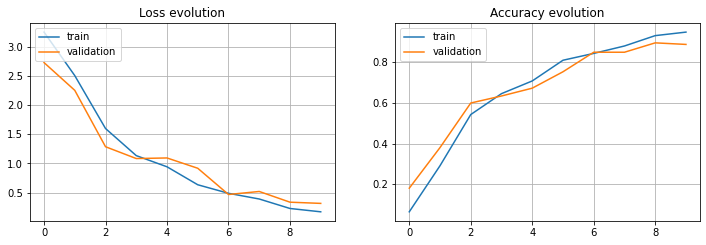

In [98]:
# SMALL MODEL
#This will actually train the model.
#You will want to change the epochs to something small enough to run on your computer.
#Maybe 3 to 10 if you do not have a GPU doing the work.
training_results_sml = model.fit_generator(
        train_generator_sml, #training set
        steps_per_epoch = len(train_generator_sml), 
        epochs=10, #number of epochs 
        validation_data = validation_generator_sml, #testing set
        validation_steps = len(validation_generator_sml)
        )

#Visualizing the training performance
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(training_results_sml.history['loss'], label='Loss')
plt.plot(training_results_sml.history['val_loss'], label='val_Loss')
plt.legend(['train', 'validation'], loc='upper left')
plt.grid()
plt.title('Loss evolution')

plt.subplot(2, 2, 2)
plt.plot(training_results_sml.history['categorical_accuracy'], label='accuracy')
plt.plot(training_results_sml.history['val_categorical_accuracy'], label='val_accuracy')
plt.legend(['train', 'validation'], loc='upper left')
plt.grid()
plt.title('Accuracy evolution')

In [99]:
model.save('/content/drive/MyDrive/ColabNotebooks/SmlModel',save_format='tf')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/ColabNotebooks/SmlModel/assets


In [44]:
new_model = keras.models.load_model('/content/drive/MyDrive/ColabNotebooks/SmlModel')

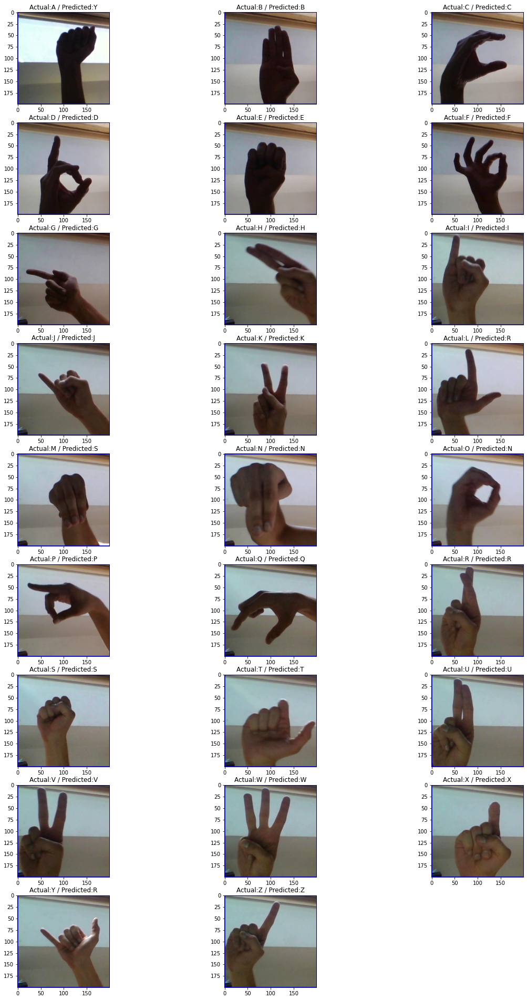

In [47]:
plt.figure(figsize=(20,38))
classes = os.listdir(test_path)
for i in enumerate(classes):
    image = os.listdir(test_path+i[1])[0]
    image = Image.open(test_path+i[1]+'/'+image)
    image = np.asarray(image)
    image = image/255

    plt.subplot(10,3,i[0]+1)
    plt.imshow(image)

    pred = np.argmax(new_model.predict(image.reshape(-1,200,200,3)))
    for j in train_data.class_indices:
        if pred == train_data.class_indices[j]:
            prediction=j
        else:
            continue

    plt.title('Actual:{0} / Predicted:{1}'.format(i[1],prediction))

In [102]:
# Batch Normalization
def create_norm_model():
  model2 = Sequential()
  model2.add(Conv2D(26, (3, 3), activation = 'relu', input_shape=(img_width, img_height, 3)))
  model2.add(BatchNormalization())
  model2.add(Conv2D(26, (3, 3), activation = 'relu'))
  model2.add(BatchNormalization())
  model2.add(Conv2D(26, (3, 3), activation = 'relu'))
  model2.add(BatchNormalization())
  model2.add(Flatten())
  model2.add(BatchNormalization()) #flatten the convolutional layer so it can go into a fully-connected layer
  model2.add(Dense(26))
  model2.add(BatchNormalization()) #fully-connected layer
  model2.add(Dense(26,activation=tf.keras.activations.softmax))
  

  # need to compile the model before you can use it
  opt = SGD(lr=0.001, momentum=0.9)
  model2.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
  return model2

model2 = create_norm_model()

Epoch 1/10
33/33 [==============================] - 14s 388ms/step - loss: 2.2110 - categorical_accuracy: 0.3913 - val_loss: 3.2886 - val_categorical_accuracy: 0.0385
Epoch 2/10
33/33 [==============================] - 12s 375ms/step - loss: 1.2906 - categorical_accuracy: 0.7288 - val_loss: 3.3060 - val_categorical_accuracy: 0.0385
Epoch 3/10
33/33 [==============================] - 12s 377ms/step - loss: 0.8015 - categorical_accuracy: 0.9192 - val_loss: 3.3677 - val_categorical_accuracy: 0.0846
Epoch 4/10
33/33 [==============================] - 12s 378ms/step - loss: 0.5824 - categorical_accuracy: 0.9692 - val_loss: 3.4285 - val_categorical_accuracy: 0.0385
Epoch 5/10
33/33 [==============================] - 12s 374ms/step - loss: 0.4414 - categorical_accuracy: 0.9913 - val_loss: 3.5989 - val_categorical_accuracy: 0.0385
Epoch 6/10
33/33 [==============================] - 12s 377ms/step - loss: 0.3648 - categorical_accuracy: 0.9875 - val_loss: 3.9204 - val_categorical_accuracy: 0.038

Text(0.5, 1.0, 'Accuracy evolution')

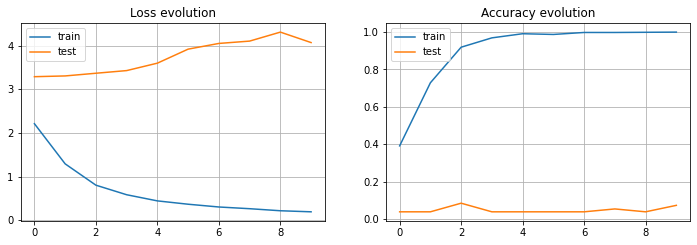

In [104]:
# Small Model 
#This will actually train the model.
#You will want to change the epochs to something small enough to run on your computer.
#Maybe 3 to 10 if you do not have a GPU doing the work.
training_resultsSMLnorm = model2.fit_generator(
        train_generator_sml, #training set
        steps_per_epoch = len(train_generator_sml), 
        epochs=10, #number of epochs 
        validation_data = validation_generator_sml, #testing set
        validation_steps = len(validation_generator_sml)
        )

#Visualizing the training performance
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(training_resultsSMLnorm.history['loss'], label='Loss')
plt.plot(training_resultsSMLnorm.history['val_loss'], label='val_Loss')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.title('Loss evolution')

plt.subplot(2, 2, 2)
plt.plot(training_resultsSMLnorm.history['categorical_accuracy'], label='accuracy')
plt.plot(training_resultsSMLnorm.history['val_categorical_accuracy'], label='val_accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.title('Accuracy evolution')

In [105]:
model2.save('/content/drive/MyDrive/ColabNotebooks/SmlNorm/',save_format='tf')

INFO:tensorflow:Assets written to: /content/drive/MyDrive/ColabNotebooks/SmlNorm/assets


In [106]:
new_modelSmlNorm = keras.models.load_model('/content/drive/MyDrive/ColabNotebooks/SmlNorm/')

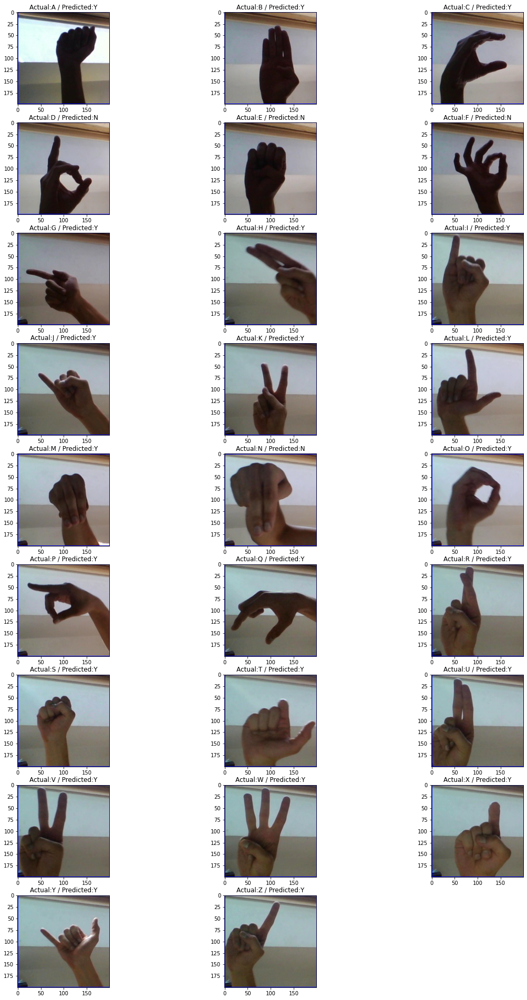

In [107]:
plt.figure(figsize=(20,38))
classes = os.listdir(test_path)
for i in enumerate(classes):
    image = os.listdir(test_path+i[1])[0]
    image = Image.open(test_path+i[1]+'/'+image)
    image = np.asarray(image)
    image = image/255

    plt.subplot(10,3,i[0]+1)
    plt.imshow(image)

    pred = np.argmax(new_modelSmlNorm.predict(image.reshape(-1,200,200,3)))
    for j in train.class_indices:
        if pred == train.class_indices[j]:
            prediction=j
        else:
            continue

    plt.title('Actual:{0} / Predicted:{1}'.format(i[1],prediction))


In [108]:
# full model - not normalized
def create_model():
  model3 = Sequential()
  model3.add(Conv2D(26, (3, 3), activation = 'relu', input_shape=(img_width, img_height, 3)))
  model3.add(Conv2D(26, (3, 3), activation = 'relu'))
  model3.add(Conv2D(26, (3, 3), activation = 'relu'))
  model3.add(Flatten()) #flatten the convolutional layer so it can go into a fully-connected layer
  model3.add(Dense(26)) #fully-connected layer
  model3.add(Dense(26,activation=tf.keras.activations.softmax))

  # need to compile the model before you can use it
  opt = SGD(lr=0.001, momentum=0.9)
  model3.compile(optimizer=opt, loss='categorical_crossentropy', metrics=['categorical_accuracy'])
  return model

model3 = create_model()

Epoch 1/10
1944/1944 [==============================] - 50173s 26s/step - loss: 3.2584 - categorical_accuracy: 0.0386 - val_loss: 3.2581 - val_categorical_accuracy: 0.0385
Epoch 2/10
1944/1944 [==============================] - 724s 373ms/step - loss: 3.2583 - categorical_accuracy: 0.0375 - val_loss: 3.2581 - val_categorical_accuracy: 0.0385
Epoch 3/10
1944/1944 [==============================] - 716s 368ms/step - loss: 3.2583 - categorical_accuracy: 0.0372 - val_loss: 3.2581 - val_categorical_accuracy: 0.0385
Epoch 4/10
1944/1944 [==============================] - 718s 369ms/step - loss: 3.2583 - categorical_accuracy: 0.0372 - val_loss: 3.2581 - val_categorical_accuracy: 0.0385
Epoch 5/10
1944/1944 [==============================] - 720s 371ms/step - loss: 3.2583 - categorical_accuracy: 0.0364 - val_loss: 3.2581 - val_categorical_accuracy: 0.0385
Epoch 6/10
1944/1944 [==============================] - 724s 372ms/step - loss: 3.2583 - categorical_accuracy: 0.0374 - val_loss: 3.2581 - v

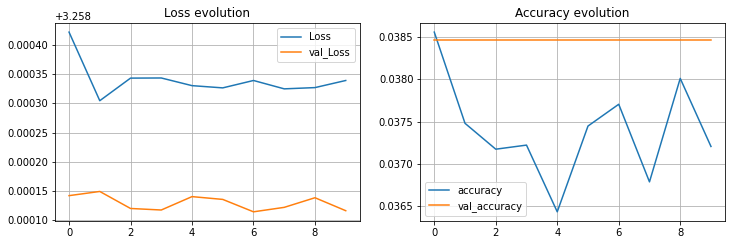

In [110]:
#full-sized Model 
#This will actually train the model.
#You will want to change the epochs to something small enough to run on your computer.
#Maybe 3 to 10 if you do not have a GPU doing the work.
training_results = model3.fit_generator(
        train_generator, #training set
        steps_per_epoch = len(train_generator), 
        epochs=10, #number of epochs 
        validation_data = validation_generator, #testing set
        validation_steps = len(validation_generator)
        )

#Visualizing the training performance
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(training_results.history['loss'], label='Loss')
plt.plot(training_results.history['val_loss'], label='val_Loss')
plt.legend()
plt.grid()
plt.title('Loss evolution')

plt.subplot(2, 2, 2)
plt.plot(training_results.history['categorical_accuracy'], label='accuracy')
plt.plot(training_results.history['val_categorical_accuracy'], label='val_accuracy')
plt.legend()
plt.grid()
plt.title('Accuracy evolution')

model.save('/content/drive/MyDrive/ColabNotebooks/FullModel/',save_format='tf')

In [112]:
new_modelFull = keras.models.load_model('/content/drive/MyDrive/ColabNotebooks/FullModel/')

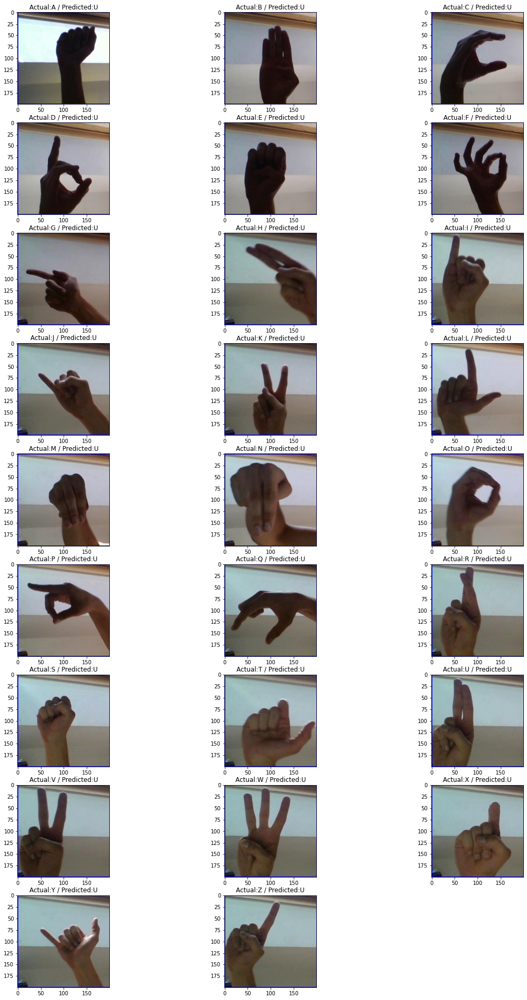

In [113]:
plt.figure(figsize=(20,38))
classes = os.listdir(test_path)
for i in enumerate(classes):
    image = os.listdir(test_path+i[1])[0]
    image = Image.open(test_path+i[1]+'/'+image)
    image = np.asarray(image)
    image = image/255

    plt.subplot(10,3,i[0]+1)
    plt.imshow(image)

    pred = np.argmax(new_modelFull.predict(image.reshape(-1,200,200,3)))
    for j in train_data.class_indices:
        if pred == train_data.class_indices[j]:
            prediction=j
        else:
            continue

    plt.title('Actual:{0} / Predicted:{1}'.format(i[1],prediction))


In [19]:
# Batch Normalization
def create_norm_model():
  model4 = Sequential()
  model4.add(Conv2D(26, (3, 3), activation = 'softmax', input_shape=(img_width, img_height, 3)))
  model4.add(BatchNormalization())
  model4.add(Conv2D(26, (3, 3), activation = 'softmax'))
  model4.add(BatchNormalization())
  model4.add(Conv2D(26, (3, 3), activation = 'softmax'))
  model4.add(BatchNormalization())
  model4.add(Flatten())
  model4.add(BatchNormalization()) #flatten the convolutional layer so it can go into a fully-connected layer
  model4.add(Dense(26))
  model4.add(BatchNormalization()) #fully-connected layer
  model4.add(Dense(26,activation=tf.keras.activations.softmax))
  

  # need to compile the model before you can use it
  opt = SGD(lr=0.001, momentum=0.9)
  model4.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['categorical_accuracy'])
  return model4

model4 = create_norm_model()

Epoch 1/40
1944/1944 [==============================] - 762s 392ms/step - loss: 1.9760 - categorical_accuracy: 0.4018 - val_loss: 3.3546 - val_categorical_accuracy: 0.2218
Epoch 2/40
1944/1944 [==============================] - 761s 391ms/step - loss: 0.9452 - categorical_accuracy: 0.6978 - val_loss: 3.3656 - val_categorical_accuracy: 0.3626
Epoch 3/40
1944/1944 [==============================] - 759s 390ms/step - loss: 0.6201 - categorical_accuracy: 0.7987 - val_loss: 2.7631 - val_categorical_accuracy: 0.4548
Epoch 4/40
1944/1944 [==============================] - 759s 390ms/step - loss: 0.4447 - categorical_accuracy: 0.8527 - val_loss: 3.4532 - val_categorical_accuracy: 0.4554
Epoch 5/40
1944/1944 [==============================] - 760s 391ms/step - loss: 0.3414 - categorical_accuracy: 0.8877 - val_loss: 4.1411 - val_categorical_accuracy: 0.4080
Epoch 6/40
1944/1944 [==============================] - 756s 389ms/step - loss: 0.2716 - categorical_accuracy: 0.9089 - val_loss: 3.2249 - v

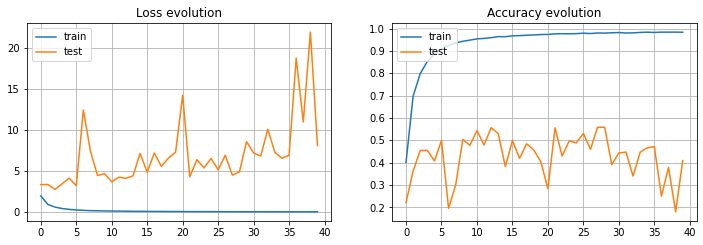

In [20]:
# Full Model -- normalized
#This will actually train the model.
#You will want to change the epochs to something small enough to run on your computer.
#Maybe 3 to 10 if you do not have a GPU doing the work.
training_resultsNorm = model4.fit_generator(
        train_generator, #training set
        steps_per_epoch = len(train_generator), 
        epochs=40, #number of epochs 
        validation_data = validation_generator, #testing set
        validation_steps = len(validation_generator)
        )

#Visualizing the training performance
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
plt.plot(training_resultsNorm.history['loss'], label='Loss')
plt.plot(training_resultsNorm.history['val_loss'], label='val_Loss')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.title('Loss evolution')

plt.subplot(2, 2, 2)
plt.plot(training_resultsNorm.history['categorical_accuracy'], label='accuracy')
plt.plot(training_resultsNorm.history['val_categorical_accuracy'], label='val_accuracy')
plt.legend(['train', 'test'], loc='upper left')
plt.grid()
plt.title('Accuracy evolution')

model4.save('/content/drive/MyDrive/ColabNotebooks/FullNorm/',save_format='tf')

In [21]:
new_modelFullNorm = keras.models.load_model('/content/drive/MyDrive/ColabNotebooks/FullNorm/')

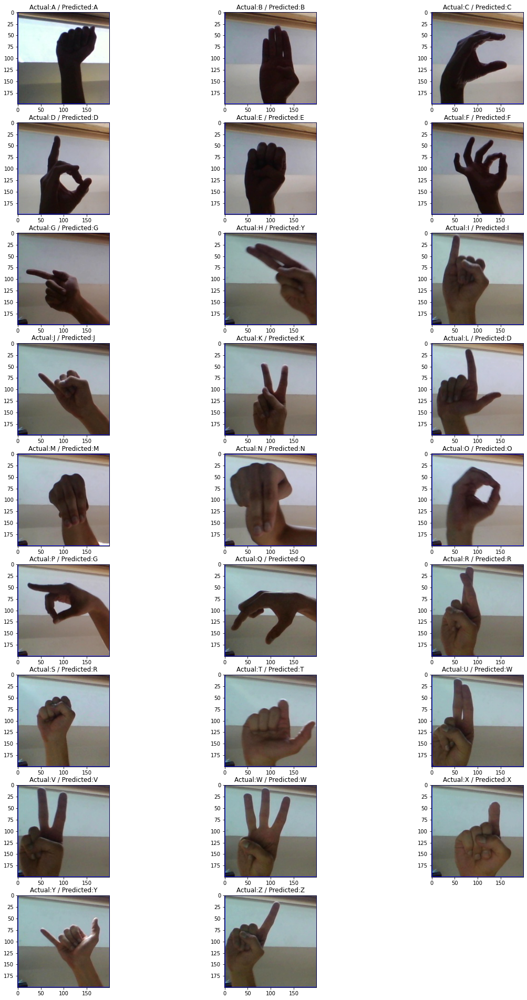

In [48]:
plt.figure(figsize=(20,38))
classes = os.listdir(test_path)
for i in enumerate(classes):
    image = os.listdir(test_path+i[1])[0]
    image = Image.open(test_path+i[1]+'/'+image)
    image = np.asarray(image)
    image = image/255

    plt.subplot(10,3,i[0]+1)
    plt.imshow(image)

    pred = np.argmax(new_modelFullNorm.predict(image.reshape(-1,200,200,3)))
    for j in train_data.class_indices:
        if pred == train_data.class_indices[j]:
            prediction=j
        else:
            continue

    plt.title('Actual:{0} / Predicted:{1}'.format(i[1],prediction))

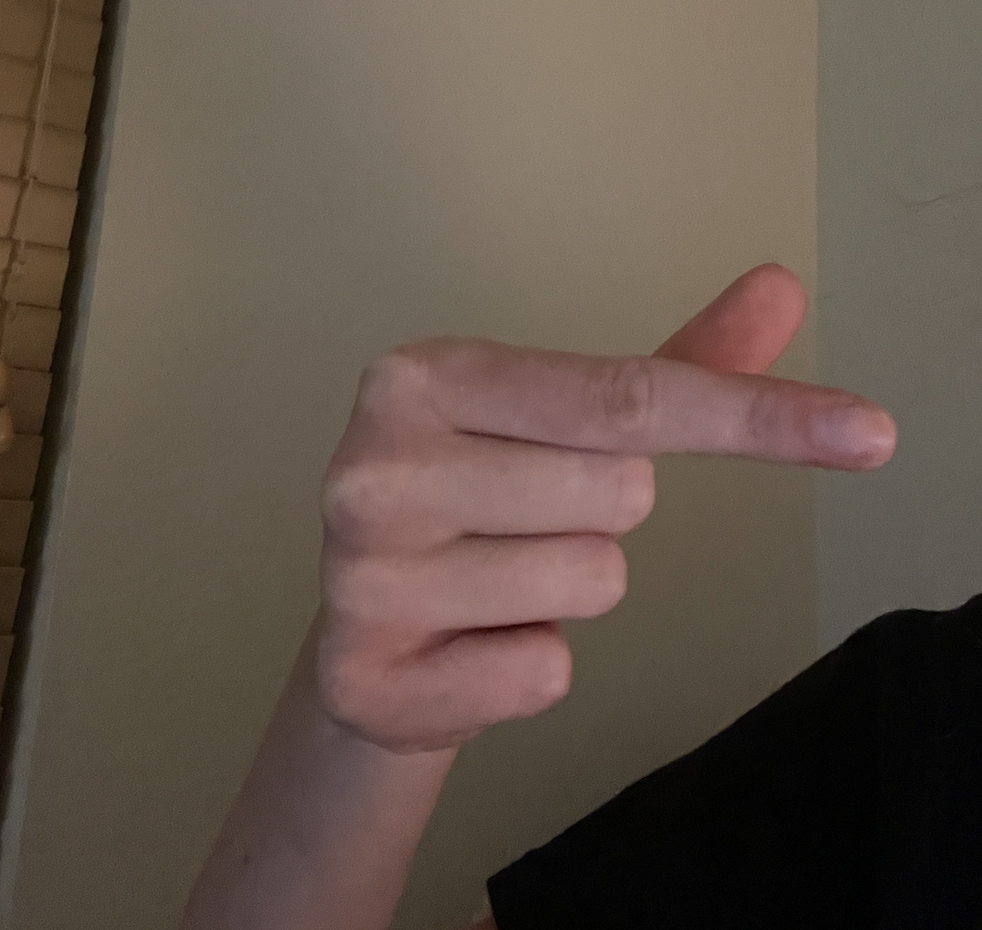

In [54]:
from IPython.display import Image
display(Image('/content/drive/MyDrive/ColabNotebooks/G.png', width=200, height=200))

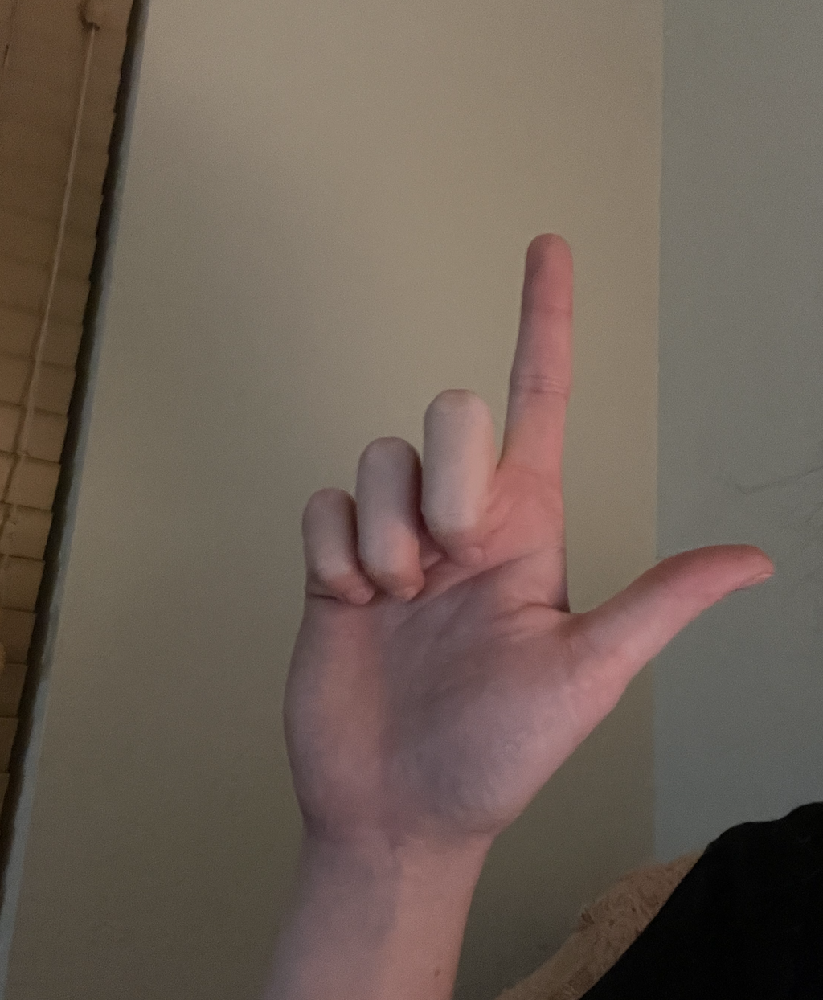

In [55]:
display(Image('/content/drive/MyDrive/ColabNotebooks/L.png', width=200, height=200))

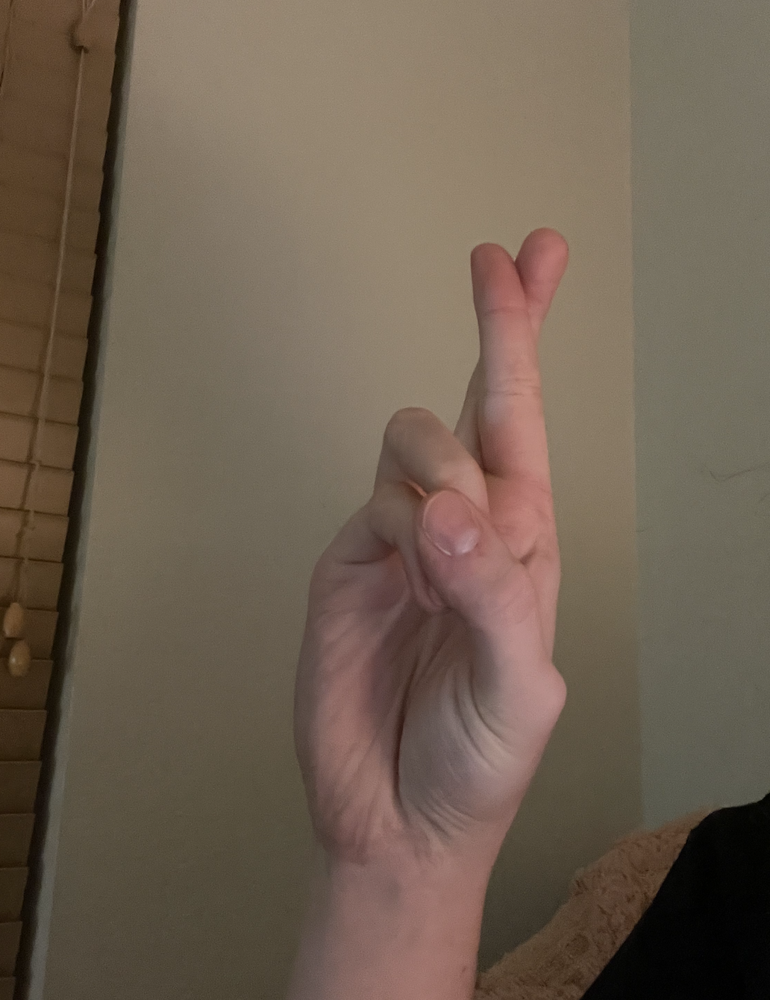

In [56]:
display(Image('/content/drive/MyDrive/ColabNotebooks/R.png', width=200, height=200))

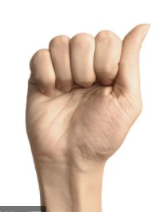

In [64]:
display(Image('/content/drive/MyDrive/ColabNotebooks/ATest.png', width=200, height=200))

In [66]:
#try your own image..

from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.image import ImageDataGenerator
# used to rescale the pixel values from [0, 255] to between 0 and 1
datagen = ImageDataGenerator(rescale=1.0/255.0)
img = load_img('/content/drive/MyDrive/ColabNotebooks/ATest.png', target_size=(200, 200))
img2 = load_img('/content/drive/MyDrive/ColabNotebooks/L.png', target_size=(200, 200))
img3 = load_img('/content/drive/MyDrive/ColabNotebooks/G.png', target_size=(200, 200))
img4 = load_img('/content/drive/MyDrive/ColabNotebooks/R.png', target_size=(200, 200))

# convert to array
img = img_to_array(img)
img2 = img_to_array(img2)
img3 = img_to_array(img3)
img4 = img_to_array(img4)
# reshape into a single sample with 3 channels

img = img.reshape(-1, 200, 200, 3)
img = img.astype('float32')
img = datagen.standardize(img)

img2 = img2.reshape(-1, 200, 200, 3)
img2 = img2.astype('float32')
img2 = datagen.standardize(img2)

img3 = img3.reshape(-1, 200, 200, 3)
img3 = img3.astype('float32')
img3 = datagen.standardize(img3)

img4 = img4.reshape(-1, 200, 200, 3)
img4 = img4.astype('float32')
img4 = datagen.standardize(img4)

# predict the class  
result = new_modelFullNorm.predict(img)
result2 = new_modelFullNorm.predict(img2)
result3 = new_modelFullNorm.predict(img3)
result4 = new_modelFullNorm.predict(img4)
print(result.argmax())
print(result2.argmax())
print(result3.argmax())print(result4.argmax())

4
12
14
13


Predictions:


*   'A' is predicted as 'E'
*   'L' is predicted as 'M'
*   'G' is predicted as 'O'
*   'R' is predicted as 'N'



In [50]:
test_generator.class_indices

{'A': 0,
 'B': 1,
 'C': 2,
 'D': 3,
 'E': 4,
 'F': 5,
 'G': 6,
 'H': 7,
 'I': 8,
 'J': 9,
 'K': 10,
 'L': 11,
 'M': 12,
 'N': 13,
 'O': 14,
 'P': 15,
 'Q': 16,
 'R': 17,
 'S': 18,
 'T': 19,
 'U': 20,
 'V': 21,
 'W': 22,
 'X': 23,
 'Y': 24,
 'Z': 25}